In [144]:
import sympy as sp
from sympy.utilities.lambdify import lambdify
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
sp.init_printing()

In [235]:
x = sp.Symbol('x',real=True)
y = sp.Symbol('y', real=True)

h = sp.Symbol('hbar', integer=True, positive=True)
m = sp.Symbol('m', integer=True, positive=True)
L = sp.Symbol('L',real=True,positive=True)
ex = sp.Symbol('ex', real=True)
ey = sp.Symbol('ey', real=True)
N = sp.Symbol('N', real=True)
nx = sp.Symbol('nx', real=True,positive=True)
ny = sp.Symbol('ny', real=True,positive=True)
t = sp.Symbol('t',real=True, positive=True)

psi = sp.Function('psi')

In [236]:
eq1 = sp.Eq(psi(x,y), N*sp.sin(x*sp.sqrt(2*m*ex/h**2))*sp.sin(y*sp.sqrt(2*m*ey/h**2)))
eq1
#rownanie funkcji falowej ktora spelnia warunki brzegowe 

In [237]:
eq2 = sp.Eq(psi(x,y), 2/L * sp.sin(nx*sp.pi*x/L)*sp.sin(ny*sp.pi*y/L))
eq2
#rownanie funkcji falowej z warunkami o calkowalnosci energi dwoch niezaleznych funkcji falowych do jedynki gdzie L to szerokosci studni a nx ny to poziomy energii

In [238]:
psi = 2/L * sp.sin(nx*sp.pi*x/L)*sp.sin(ny*sp.pi*y/L)
psi

In [239]:
psif = lambdify((x,y,nx,ny), psi.subs({L: 1}))
psif

<function _lambdifygenerated(x, y, nx, ny)>

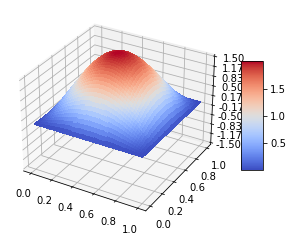

In [240]:
fig, ax = plt.subplots(subplot_kw={"projection": "3d"})
xs = np.linspace(0,1,1000)
ys = np.linspace(0,1,1000)
X, Y = np.meshgrid(xs,ys)
Z = psif(X,Y,1,1)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(-1.5, 1.5)
ax.zaxis.set_major_locator(LinearLocator(10))
# A StrMethodFormatter is used automatically
ax.zaxis.set_major_formatter('{x:.02f}')

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)

plt.show()

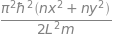

In [241]:
E = h**2 * sp.pi**2 * (nx**2 + ny**2)/(2*m*L**2)
E

In [242]:
PSI = psi * sp.exp(-E*sp.I*t/h)
PSI
#Funkcja falowa zależna od czasu

In [246]:
PSIF = lambdify((x,y,nx,ny,t),PSI.subs({h: 1, m: 1, L: 1}))


In [258]:
dt = 0.001
n1 = 3
n2 = 2

def update(i, z, line):
    t = i*dt
    z = PSIF(xs,ys,n1,n2,t)
    ax.clear()
    line = ax.plot_surface(xs,ys,z,cmap=cm.coolwarm)
    ax.set_zlim(-1.5, 1.5)
    return line,

fig = plt.figure()
ax = fig.add_subplot(111,projection='3d')

xs = np.linspace(0, 1, 1000)
ys = np.linspace(0, 1, 1000)

xs,ys = np.meshgrid(xs,ys)
plt.close()
z = PSIF(xs,ys,n1,n2,0)

line = ax.plot_surface(xs,ys,z,cmap=cm.coolwarm)

ax.set_zlim(-1.5, 1.5)

anim = FuncAnimation(
    fig, update, fargs=(z, line), interval=30, blit=False)

HTML(anim.to_jshtml())

d:\Python\anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


In [256]:
dt = 0.01
n1 = 1
n2 = 1

def update(i, z, line):
    t = i*dt
    z = np.abs(PSIF(xs,ys,n1,n2,t)/np.sqrt(2) + PSIF(xs,ys,n1,2*n2,t)/np.sqrt(2))**2
    ax.clear()
    line = ax.plot_surface(xs,ys,z,cmap=cm.coolwarm)
    ax.set_zlim(0, 5)
    return line,

fig = plt.figure()
ax = fig.add_subplot(111,projection='3d')

xs = np.linspace(0, 1, 1000)
ys = np.linspace(0, 1, 1000)

xs,ys = np.meshgrid(xs,ys)
plt.close()
z = np.abs(PSIF(xs,ys,n1,n2,0)/np.sqrt(2) + PSIF(xs,ys,2*n1,2*n2,0)/np.sqrt(2))**2

line = ax.plot_surface(xs,ys,z,cmap=cm.coolwarm)

ax.set_zlim(0, 5)

anim = FuncAnimation(
    fig, update, fargs=(z, line), interval=30, blit=False)

HTML(anim.to_jshtml())